# JaxRenderer Demo

Self-link: https://colab.research.google.com/drive/1FF4wTHW4dL30_0lF7X6ZQZ2QSzFiOkXF

<details>
  <summary>Other benchmarks</summary>

Batch-Rendering Brax Env: https://colab.research.google.com/drive/1bbrBZq2DNPoBjmKbsmZJ_1HUOI7Tg7hk

Policy Generation: https://colab.research.google.com/drive/1mD54FTbfWD_E233YQCBuJ9d-qDZUbocU

Generate data: https://colab.research.google.com/drive/1c_83TLtb_pOt4OSlWFQgIKzA9DxdBDTp

Benchmarking using A100 on 32x32 canvas with various envs: https://colab.research.google.com/drive/1n-K33VkFdWy_rzbQrK-szmgeL61jq7lw

Benchmarking using A100 on 32x32 canvas: https://colab.research.google.com/drive/180T5YOd3HaSILWBSl2nhzRbqMXT8_oO7

Benchmarking using T4 on 32x32 canvas: https://colab.research.google.com/drive/1Z-nH_wn-QZ_BcjlwK32N3GIlh7ZyWAwF

Benchmarking using A100 on micro canvas (84x84): https://colab.research.google.com/drive/1-lToQZ3ZGAVQrnHy39JfneM9iT2HOfaT

Benchmarking using T4 on micro canvas (84x84): https://colab.research.google.com/drive/1Pa5OBHAGmKnuVhvTvgsIhPYJ1WNhdfE6

Benchmarking using T4 on small canvas: https://colab.research.google.com/drive/1X_IbG5SGdQ_GnsjjlBaF9pJQR7vu8Aml

Benchmarking using A100 on small canvas: https://colab.research.google.com/drive/1Mr2pRetdobZdgdtNT_DJuS4YZq3-C4oY

Benchmarking using A100 on larger canvas: https://colab.research.google.com/drive/1A7PzhG3vn6oNzrWTxE5E3dmu8xQTcNnH

Benchmarking using T4, and baseline (CPU PyTinyrenderer): https://colab.research.google.com/drive/1xhkYNz5WjvUCjQWpp72CLf9SIy3i5PnN

</details>

<details>
  <summary>Other related profiling/benchmarking Colabs</summary>

Profile with pre-generated data: https://colab.research.google.com/drive/12yNBVOdwUqUOBRgmQHF0gl8eMzzIi_BH

Previous profile version (profile branch head): https://colab.research.google.com/drive/1V7gdTY6ZYz7YhJI_LCWLZM035zSDTYoQ

Previous prfiling version: https://colab.research.google.com/drive/1BJQG38IHPaUuMKMnNeq0hjrLtqwx4OfU

All-inlines + minibatch loops: https://colab.research.google.com/drive/1NiCTOCxfU0Mvr818Zqt4y63-S20Gn8yb

All-inlines: https://colab.research.google.com/drive/1Wrt3a0yoVPhYUJYCZltFIYoELWD-ciE0

Baseline link: https://colab.research.google.com/drive/17NSjyJL_Ov9D32Mnrs7miZmjiPNf9U6l

</details>

> Majority of the code is adopted from [Brax Teams's Brax Training](https://colab.research.google.com/github/google/brax/blob/main/notebooks/training.ipynb), with minor modifications on the visualisation part.

The sample output is executed with A100, with High RAM (since this is the only configuration available).

Research supported with Cloud TPUs from [Google's TPU Research Cloud (TRC)](https://sites.research.google/trc/).

In [ ]:
#@title Install jaxrenderer and numpngw (for visualisation) from PyPI
!pip install jaxrenderer -qqqq
!pip install numpngw -qqqq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.1/76.1 kB 8.0 MB/s eta 0:00:00


In [ ]:
#@title ## Imports
#@markdown **⚠️ PLEASE NOTE:**

#@markdown This colab runs best using a GPU runtime. From the Colab menu, choose Runtime > Change Runtime Type, then select **'GPU'** in the dropdown.

#@markdown If you have a TPU runtime, you can also consider connect to [local runtime](https://research.google.com/colaboratory/local-runtimes.html), like Google Cloud TPU VM.
#@markdown The built-in TPU runtime on Colab will not work as it only supports jax==0.3.25 while jaxrenderer requries jax>=0.4.0
#@markdown Alternatively, you may try Kaggle Notebook which provides jax>=0.4.0 and Python 3.8+.

import functools
from typing import Iterable, NamedTuple, Optional

import jax
from jax import numpy as jp
import numpy as onp
import matplotlib.animation as animation
import matplotlib.pyplot as plt
from PIL import Image

from jaxrenderer import CameraParameters as Camera
from jaxrenderer import LightParameters as Light
from jaxrenderer import Model as RendererMesh
from jaxrenderer import ModelObject as Instance
from jaxrenderer import ShadowParameters as Shadow
from jaxrenderer import Renderer, merge_objects, transpose_for_display
from jaxrenderer.geometry import rotation_matrix

In [ ]:
import re

from jaxrenderer.types import Vec3f, Vec2f

#@title ## Download and Load Models
def make_model(fileContent: list[str], diffuse_map, specular_map) -> RendererMesh:
    verts: list[Vec3f] = []
    norms: list[Vec3f] = []
    uv: list[Vec2f] = []
    faces: list[list[int]] = []
    faces_norm: list[list[int]] = []
    faces_uv: list[list[int]] = []

    _float = re.compile(r"(-?\d+\.?\d*(?:e[+-]\d+)?)")
    _integer = re.compile(r"\d+")
    _one_vertex = re.compile(r"\d+/\d*/\d*")
    for line in fileContent:
        if line.startswith("v "):
            vert: Vec3f = tuple(map(float, _float.findall(line, 2)[:3]))
            verts.append(vert)
        elif line.startswith("vn "):
            norm: Vec3f = tuple(map(float, _float.findall(line, 2)[:3]))
            norms.append(norm)
        elif line.startswith("vt "):
            uv_coord: Vec2f = tuple(map(float, _float.findall(line, 2)[:2]))
            uv.append(uv_coord)
        elif line.startswith("f "):
            face: list[int] = []
            face_norm: list[int] = []
            face_uv: list[int] = []

            vertices: list[str] = _one_vertex.findall(line)
            assert len(vertices) == 3, ("Expected 3 vertices, "
                                        f"(got {len(vertices)}")
            for vertex in _one_vertex.findall(line):
                indices: list[int] = list(map(int, _integer.findall(vertex)))
                assert len(indices) == 3, ("Expected 3 indices (v/vt/vn), "
                                           f"got {len(indices)}")
                v, vt, vn = indices
                # indexed from 1 in Wavefront Obj
                face.append(v - 1)
                face_norm.append(vn - 1)
                face_uv.append(vt - 1)

            faces.append(face)
            faces_norm.append(face_norm)
            faces_uv.append(face_uv)

    return RendererMesh(
        verts=jp.array(verts),
        norms=jp.array(norms),
        uvs=jp.array(uv),
        faces=jp.array(faces),
        faces_norm=jp.array(faces_norm),
        faces_uv=jp.array(faces_uv),
        diffuse_map=jax.numpy.swapaxes(diffuse_map, 0, 1)[:, ::-1, :],
        specular_map=jax.numpy.swapaxes(specular_map, 0, 1)[:, ::-1],
    )

def load_tga(path: str):
    image: Image.Image = Image.open(path)
    width, height = image.size
    buffer = onp.zeros((width, height, 3))

    for y in range(height):
        for x in range(width):
            buffer[y, x] = onp.array(image.getpixel((x, y)))

    texture = jp.array(buffer, dtype=jp.single)

    return texture

!wget "https://raw.githubusercontent.com/ssloy/tinyrenderer/79c0d0264a6869b900190804f70f64eec266b58e/obj/african_head/african_head.obj" -O "african_head.obj" -q
!wget "https://github.com/ssloy/tinyrenderer/blob/79c0d0264a6869b900190804f70f64eec266b58e/obj/african_head/african_head_diffuse.tga?raw=true" -O "african_head_diffuse.tga" -q
!wget "https://github.com/ssloy/tinyrenderer/blob/6d3acdb9ee452449b528ef3900ef5528dad0f807/obj/african_head/african_head_spec.tga?raw=true" -O "african_head_spec.tga" -q
!wget "https://github.com/ssloy/tinyrenderer/blob/6d3acdb9ee452449b528ef3900ef5528dad0f807/obj/african_head/african_head_nm_tangent.tga?raw=true" -O "african_head_nm_tangent.tga" -q

obj_path: str = "african_head.obj"
texture_path: str = "african_head_diffuse.tga"
spec_path: str = "african_head_spec.tga"
normal_tangent_path: str = "african_head_nm_tangent.tga"

texture = load_tga(texture_path) / 255
specular_map = load_tga(spec_path)[..., 0]
model: RendererMesh = make_model(open(obj_path, 'r').readlines(), texture, specular_map)

In [ ]:
#@title ## Utility Code and Constants

canvas_width: int = 1920 #@param {type:"integer"}
canvas_height: int = 1080 #@param {type:"integer"}
frames: int = 30 #@param {type:"slider", min:1, max:32, step:1}
rotation_axis = "Y" #@param ["X", "Y", "Z"]
rotation_degrees: float = 360.

rotation_axis = dict(
    X=(1., 0., 0.),
    Y=(0., 1., 0.),
    Z=(0., 0., 1.),
)[rotation_axis]

degrees = jax.lax.iota(float, frames) * rotation_degrees / frames

## Experiment

In [ ]:
#@title ### Render function

@jax.default_matmul_precision("float32")
def render_instances(
  instances: list[Instance],
  width: int,
  height: int,
  camera: Camera,
  light: Optional[Light] = None,
  shadow: Optional[Shadow] = None,
  camera_target: Optional[jp.ndarray] = None,
  enable_shadow: bool = True,
) -> jp.ndarray:
  """Renders an RGB array of sequence of instances.

  Rendered result is not transposed with `transpose_for_display`; it is in
  floating numbers in [0, 1], not `uint8` in [0, 255].
  """
  if light is None:
    direction = jp.array([0.57735, -0.57735, 0.57735])
    light = Light(
        direction=direction,
        ambient=0.1,
        diffuse=0.85,
        specular=0.05,
    )
  if shadow is None and enable_shadow:
    assert camera_target is not None, 'camera_target is None'
    shadow = Shadow(centre=camera_target)
  elif not enable_shadow:
    shadow = None

  img = Renderer.get_camera_image(
    objects=instances,
    light=light,
    camera=camera,
    width=width,
    height=height,
    shadow_param=shadow,
    colour_default=jp.zeros(3, dtype=jp.single),
  )
  arr = jax.lax.clamp(0., img, 1.)

  return arr

def gen_compile_render(instances):
  """Return batched states."""
  # parameters
  # camera
  eye = jp.array((0, 0, 3.))
  center = jp.array((0, 0, 0))
  up = jp.array((0, 1, 0))
  camera: Camera = Camera(viewWidth=canvas_width, viewHeight=canvas_height, position=eye, target=center, up=up)


  def render(batched_instances) -> jp.ndarray:
    def _render(instances) -> jp.ndarray:
      _render = jax.jit(
        render_instances,
        static_argnames=("width", "height", "enable_shadow"),
        inline=True,
      )
      img = _render(instances=instances, width=canvas_width, height=canvas_height, camera=camera, camera_target=center)
      arr = transpose_for_display((img * 255).astype(jp.uint8))

      return arr

    # render
    _render_batch = jax.jit(jax.vmap(_render))
    images = _render_batch(batched_instances)

    return images

  def copy_back_images(images: jp.ndarray) -> list[onp.ndarray]:
    # copy back
    images_in_device = jax.device_get(images)

    frames: list[onp.ndarray] = list(map(onp.asarray, images_in_device))

    return frames


  render_compiled = jax.jit(render).lower(instances).compile()

  def wrap(batched_instances) -> list[onp.ndarray]:
    images = render_compiled(batched_instances)

    return copy_back_images(images)

  return wrap

In [ ]:
#@title ### Rotate Model
def rotate(model: RendererMesh, rotation_axis: tuple[float, float, float], degree: float) -> Instance:
  instance = Instance(model=model)
  instance = instance.replace_with_orientation(rotation_matrix=rotation_matrix(rotation_axis, degree))

  return instance

gen_model = lambda degree: rotate(model, rotation_axis, degree)
print("Compile time")
batch_rotation = %time jax.jit(jax.vmap(gen_model)).lower(degrees).compile()

print("\nExecution time")
instances = %time [batch_rotation(degrees)]

Compile time
CPU times: user 633 ms, sys: 88.5 ms, total: 722 ms
Wall time: 622 ms

Execution time
CPU times: user 9.07 ms, sys: 5 µs, total: 9.07 ms
Wall time: 7.57 ms


In [ ]:
#@title ### Compile and Render
print("Compile and generate rendering function")
render_with_states = %time gen_compile_render(instances)
print()
print("Render time")
images = %time render_with_states(instances)

Compile and generate rendering function
CPU times: user 5.57 s, sys: 60.1 ms, total: 5.63 s
Wall time: 4.93 s

Render time
CPU times: user 33.7 s, sys: 32.8 s, total: 1min 6s
Wall time: 1min 6s


In [ ]:
#@title
print("# triangles:", model.faces.shape[0])

# triangles: 2492


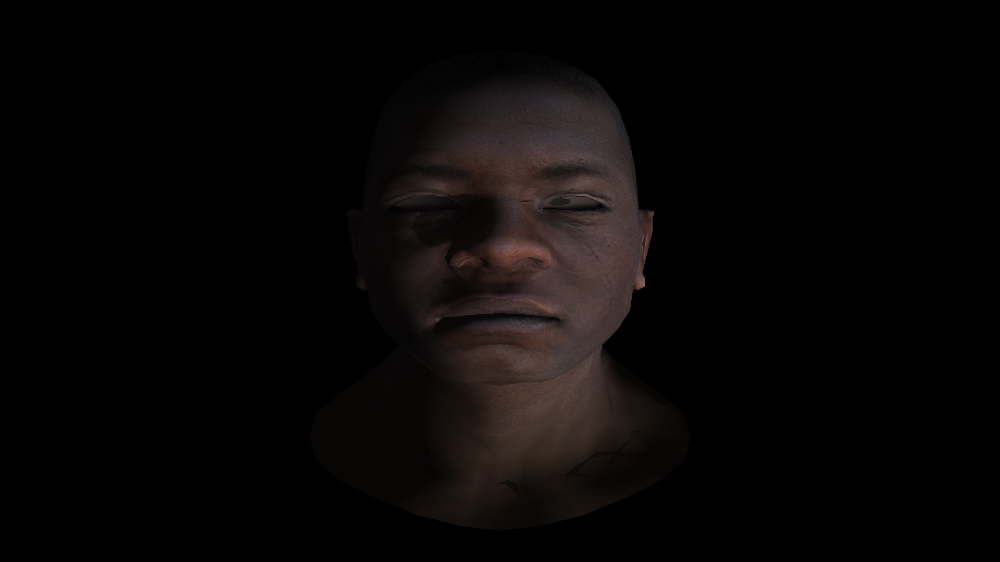

In [ ]:
#@title ### Save to disk and show
from numpngw import write_apng
from IPython.display import Image as display_Image

write_apng('animation.png', images, delay=1/30.)
display_Image(filename='animation.png')

## Differentiable Rendering

In [ ]:
#@title Imports
from functools import partial
from typing import Any, NamedTuple

import jax.lax as lax
import jax.numpy as jnp

from jaxrenderer.shader import Shader, PerVertex, PerFragment, MixerOutput
from jaxrenderer.pipeline import render
from jaxrenderer.shapes.cube import create_cube
from jaxrenderer.geometry import to_homogeneous, normalise
from jaxrenderer.geometry import Camera as _Camera
from jaxrenderer.types import Colour, Vec3f, Vec4f, LightSource

In [ ]:
#@title Shader
class CustomisedExtraInput(NamedTuple):
    position: Any
    normal: Any
    uv: Any
    light: LightSource
    texture: Any


class CustomisedExtraFragmentData(NamedTuple):
    colour: Colour = jnp.array([0.0, 0.0, 0.0])
    uv: Vec2f = jnp.zeros(2)


class CustomisedExtraMixerOutput(NamedTuple):
    canvas: Colour


class CustomisedShader(Shader[CustomisedExtraInput, CustomisedExtraFragmentData, CustomisedExtraMixerOutput]):
    @staticmethod
    @partial(jax.jit, inline=True)
    def vertex(gl_VertexID, gl_InstanceID, camera, extra):
        position: Vec4f = to_homogeneous(extra.position[gl_VertexID])
        gl_Position: Vec4f = camera.to_clip(position)

        normal: Vec3f = normalise(extra.normal[gl_VertexID])
        intensity = jnp.dot(normal, normalise(extra.light.direction))

        colour = extra.light.colour * intensity

        return (
            PerVertex(gl_Position=gl_Position),
            CustomisedExtraFragmentData(colour=colour, uv=extra.uv[gl_VertexID]),
        )

    @staticmethod
    @partial(jax.jit, inline=True)
    def fragment(gl_FragCoord, gl_FrontFacing, gl_PointCoord, varying, extra):
        built_in = Shader.fragment(
            gl_FragCoord,
            gl_FrontFacing,
            gl_PointCoord,
            varying,
            extra,
        )[0]

        # repeat texture
        uv = (lax.floor(varying.uv).astype(int) % jnp.asarray(extra.texture.shape[:2]))
        texture_colour: Colour = extra.texture[uv[0], uv[1]]
        light_colour: Colour = varying.colour

        return (
            PerFragment(use_default_depth=jnp.array(True)),
            CustomisedExtraFragmentData(
                colour=texture_colour * light_colour,
                uv=varying.uv,
            ),
        )

    @staticmethod
    @partial(jax.jit, inline=True)
    def mix(gl_FragDepth, keeps, extra):
        mixer_output, extra_output = Shader.mix(gl_FragDepth, keeps, extra)

        return (
            mixer_output,
            CustomisedExtraMixerOutput(canvas=extra_output.colour),
        )

In [ ]:
#@title Scene
_canvas_width = 80 #@param {type:"integer"}
_canvas_height = 80 #@param {type:"integer"}

scene = create_cube(
    half_extents=jnp.ones(3) * 10,
    texture_scaling=jnp.ones(2),
    diffuse_map=jnp.ones((1, 1, 3)),
    # diffuse_map=jnp.array((
    #     ((0., 0, 1), (0, 1, 0)),
    #     ((1., 0, 0), (0, 1, 1)),
    # )),
    specular_map=jnp.array(((1., 1), (1., 1))),
  )

lightR = 0.55 #@param {type:"slider", min:0, max:1, step:0.01}
lightG = 0.81 #@param {type:"slider", min:0, max:1, step:0.01}
lightB = 0.43 #@param {type:"slider", min:0, max:1, step:0.01}

light = LightSource(
    direction=jnp.array((0., 0., -1)),
    colour=jnp.array((lightR, lightG, lightB)),
)
camera = _Camera.create(
    view=_Camera.view_matrix(
      eye=jnp.array((0., 0, -1)),
      centre=jnp.zeros(3),
      up=jnp.array((0., 1., 0.)),
    ),
    projection=_Camera.perspective_projection_matrix(
      fovy=90.,
      aspect=_canvas_width / _canvas_height,
      z_near=0.001,
      z_far=1.,
    ),
    viewport=_Camera.viewport_matrix(
      lowerbound=jnp.zeros(2, dtype=int),
      dimension=jnp.array((_canvas_width, _canvas_height)),
      depth=1.,
    ),
)

In [ ]:
#@title ### Compile then Render
buffers = Renderer.create_buffers(
    width=_canvas_width,
    height=_canvas_height,
    colour_default=jnp.zeros(3),
)

extra = CustomisedExtraInput(
    position=scene.verts,
    normal=scene.norms,
    uv=scene.uvs,
    light=light,
    texture=scene.diffuse_map,
)

print("Compile")
render_compiled = %time render.lower(camera, CustomisedShader, buffers, scene.faces, extra).compile()

buffers = Renderer.create_buffers(
    width=_canvas_width,
    height=_canvas_height,
    colour_default=jnp.zeros(3),
)
print("\nRender")
target_frame = %time render_compiled(camera, buffers, scene.faces, extra)

Compile
CPU times: user 1.34 s, sys: 22.3 ms, total: 1.36 s
Wall time: 1.16 s

Render
CPU times: user 4.92 ms, sys: 0 ns, total: 4.92 ms
Wall time: 4.6 ms


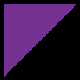

In [ ]:
write_apng('target.png', [onp.asarray(target_frame[1][0] * 255).astype(onp.uint8)])
display_Image(filename='target.png')

In [ ]:
#@title ### Optimiser to optimise light colour based on initial guess and gradient
from tqdm.auto import trange


def render_with_light_colour(light_colour):
  buffers = Renderer.create_buffers(
    width=_canvas_width,
    height=_canvas_height,
    colour_default=jnp.zeros(3),
  )

  extra = CustomisedExtraInput(
      position=scene.verts,
      normal=scene.norms,
      uv=scene.uvs,
      light=light._replace(colour=light_colour),
      texture=scene.diffuse_map,
  )

  return render(camera, CustomisedShader, buffers, scene.faces, extra)[1][0]


def loss_f(light_colour):
  """MSE"""
  curr = render_with_light_colour(light_colour)
  target = target_frame[1][0]

  return (lax.square(target - curr)).mean()


def optimise(init_light_colour):

  print("Compile grad fn")
  grad_fn = %time jax.jit(jax.grad(loss_f)).lower(init_light_colour).compile()
  print("\nCompile loss fn")
  loss_fn = %time jax.jit(loss_f).lower(init_light_colour).compile()

  light_colours = []
  light = init_light_colour
  with trange(1000) as pbar:
    for _ in pbar:
      loss = loss_fn(light)
      grad = grad_fn(light)

      pbar.set_postfix(loss=loss)
      light_colours.append(light)
      light = light - 0.1 * grad

  return light, light_colours

In [ ]:
#@title Set Initial Guess and Optimise
guess_R = 0 #@param {type:"slider", min:0, max:1, step:0.01}
guess_G = 0.41 #@param {type:"slider", min:0, max:1, step:0.01}
guess_B = 1 #@param {type:"slider", min:0, max:1, step:0.01}

result = optimise(jnp.array((guess_R, guess_G, guess_B)))

import pandas as pd
pd.DataFrame([[*light.colour], [*result[0]]], index=("target", "ours"), columns=("R", "G", "B"))

Compile grad fn
CPU times: user 1.25 s, sys: 13.1 ms, total: 1.26 s
Wall time: 1 s

Compile loss fn
CPU times: user 800 ms, sys: 10.9 ms, total: 811 ms
Wall time: 576 ms


  0%|          | 0/1000 [00:00<?, ?it/s]

,R,G,B
target,0.55,0.81,0.43
ours,0.549999,0.8099989,0.43000054


CPU times: user 3.07 ms, sys: 883 µs, total: 3.95 ms
Wall time: 4.6 ms


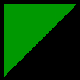

In [ ]:
#@title ### Visualise
colours = jnp.array(result[1])
batch_render_fn = jax.jit(jax.vmap(render_with_light_colour)).lower(colours).compile()

render_results = %time batch_render_fn(colours).block_until_ready()

frames = [onp.asarray(frame * 255).astype(onp.uint8) for frame in render_results]

from numpngw import write_apng
from IPython.display import Image as display_Image

write_apng('dr.png', frames, delay=1/100.)
display_Image(filename='dr.png')

In [ ]:
#@title Terminating Colab Automatically
try:
  from google.colab import runtime
  print("Terminating Colab")
  runtime.unassign()
except ModuleNotFoundError:
  print("Not in Colab, skip termination")